<a href="https://colab.research.google.com/github/teruyuki-yamasaki/HelloBrax/blob/main/HelloBraxEnv01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[BraxEnvironments.ipynb](https://colab.research.google.com/github/google/brax/blob/main/notebooks/environments.ipynb#scrollTo=_sOmCoOrF0F8)

# Brax Environments

Brax provides [Gym](https://gym.openai.com/)-like environments for training policies.  Just as in Gym, Brax environments have step and reset functions that return agent observations and rewards.  Let's try some out!

In [1]:
#@title Import Brax and some helper modules

import functools
import time

from IPython.display import HTML, Image
import gym

try:
  import brax
except ImportError:
  from IPython.display import clear_output 
  !pip install git+https://github.com/google/brax.git@main
  clear_output()
  import brax

from brax import envs
from brax import jumpy as jp
from brax.envs import to_torch
from brax.io import html
from brax.io import image
import jax
from jax import numpy as jnp
import torch
v = torch.ones(1, device='cuda')  # init torch cuda before jax

In [Brax Basics](https://colab.research.google.com/github/google/brax/blob/main/notebooks/basics.ipynb) we tried out a few simple physics systems.  In order to train agents to achieve some behavior within these systems, we define an environment: a physics system, a way for the agent to observe the system, and a reward function that defines some objective.  Brax comes with many built-in environments in order to get started quickly.

## OpenAI Gym Environments

**[ant](https://github.com/google/brax/blob/main/brax/envs/ant.py)** from [OpenAI Gym Ant-v2](https://gym.openai.com/envs/Ant-v2/): make a four-legged creature walk forward as fast as possible

**[halfcheetah](https://github.com/google/brax/blob/main/brax/envs/halfcheetah.py)** from [OpenAI Gym HalfCheetah-v2](https://gym.openai.com/envs/HalfCheetah-v2/): make a two-dimensional two-legged creature walk forward as fast as possible

**[hopper](https://github.com/google/brax/blob/main/brax/envs/hopper.py)** from [OpenAI Gym Hopper-v2](https://gym.openai.com/envs/Hopper-v2/): make a two-dimensional one-legged robot hop forward as fast as possible

**[humanoid](https://github.com/google/brax/blob/main/brax/envs/humanoid.py)** from [OpenAI Gym Humanoid-v2](https://gym.openai.com/envs/Humanoid-v2/): make a three-dimensional bipedal robot walk forward as fast as possible, without falling over.

**[reacher](https://github.com/google/brax/blob/main/brax/envs/reacher.py)**: from [OpenAI Gym Reacher-v2](https://gym.openai.com/envs/Reacher-v2/): makes a two-joint reacher arm move its tip to a target.

**[walker2d](https://github.com/google/brax/blob/main/brax/envs/walker2d.py)** from [OpenAI Gym Walker2d-v2](https://gym.openai.com/envs/Walker2d-v2/): make a two-dimensional bipedal robot walk forward as fast as possible

## Custom Environments

**[fetch](https://github.com/google/brax/blob/main/brax/envs/fetch.py)**: make a three-dimensional dog chase after a moving target.

**[grasp](https://github.com/google/brax/blob/main/brax/envs/grasp.py)**: a grabber hand must pick up a ball and carry it to a moving target.

**[ur5e](https://github.com/google/brax/blob/main/brax/envs/ur5e.py)**: a ur5e robot arm that moves its end effector to a series of targets.


In [2]:
#@title Visualizing pre-included Brax environments { run: "auto" }
#@markdown Select an environment to preview it below:

environment = "ant"  # @param ['ant', 'halfcheetah', 'hopper', 'humanoid', 'reacher', 'walker2d', 'fetch', 'grasp', 'ur5e']
env = envs.create(env_name=environment)
state = env.reset(rng=jp.random_prngkey(seed=0))

HTML(html.render(env.sys, [state.qp]))

In [ ]:
#@title Visualizing pre-included Brax environments {run: "auto"}
#@markdown Select an environment to preview it below:

environment = "ant" #@param ['ant', 'halfcheetah', 'hopper', 'humanoid', 'reacher', 'walker2d', 'fetch', 'grasp', 'ur5e']
env = envs.create(env_name=environment) 
state = env.reset(rng=jp.random_prngkey(seed=0))

HTML(html.render(env.sys, [state.qp]))

# Stepping and Jitting Environments

We operate environments via `env.step`:

$$
\text{state}_{t+1} = \text{env.step}(\text{state}_t, \text{action})
$$


The state returned by `env.step` contains:
* the physics state `QP`
* the observation vector
* reward
* whether the environment is done and needs to be reset
* other useful metrics.

By calling `env.step` in sequence we produce a rollout:

In [ ]:
state = env.reset(rng=jp.random_prngkey(seed=0))

In [3]:
%%time 
rollout = [] 
for i in range(100):
    # wiggle sinusoidally 
    action = jp.ones((env.action_size,)) * jp.sin(i * jp.pi / 15) 
    state = env.step(state, action) 
    rollout.append(state) 

CPU times: user 33 s, sys: 267 ms, total: 33.3 s
Wall time: 33.1 s


In [18]:
state = jax.jit(env.reset)(rng=jp.random_prngkey(seed=0))

In [19]:
%%time 
rollout = [] 
for i in range(100):
    # wiggle sinusoidally 
    state = jax.jit(env.step)(state, jp.ones((env.action_size,)) * jp.sin(i * jp.pi / 15) ) 
    rollout.append(state) 

CPU times: user 659 ms, sys: 96.1 ms, total: 755 ms
Wall time: 734 ms


In [8]:
%%time 

def step(state, i):
    action = jp.ones((env.action_size,)) * jp.sin(i * jp.pi / 15) 
    return env.step(state, action)

rollout = [] 
for i in range(100):
    # wiggle sinusoidally 
    state = jax.jit(step)(state, i)
    rollout.append(state) 

CPU times: user 18.2 s, sys: 292 ms, total: 18.5 s
Wall time: 14.7 s


In order to train policies quickly, we use [JAX](https://github.com/google/jax) to jit compile the `env.step`: 

In [14]:
state = env.reset(rng=jp.random_prngkey(seed=0))

In [15]:
%%time 

for i in range(100):
    state = env.step(state,  jnp.ones((env.action_size,)))

CPU times: user 55.7 s, sys: 9.2 s, total: 1min 4s
Wall time: 54.5 s


In [16]:
# jit compile env.step:
state = jax.jit(env.step)(state, jnp.ones((env.action_size,)))

In [17]:
%%time
for _ in range(100):
  state = jax.jit(env.step)(state, jnp.ones((env.action_size,)))

CPU times: user 662 ms, sys: 99.6 ms, total: 762 ms
Wall time: 742 ms


After `env.step` has been compiled, it runs much faster:

# Visualizing Rollouts

Brax provides two handy ways to visualize environment rollouts.  The first is an HTML visualizer:

In [ ]:
HTML(html.render(env.sys, [s.qp for s in rollout]))

The second is an image visualizer that produces animated GIFs or PNGs:

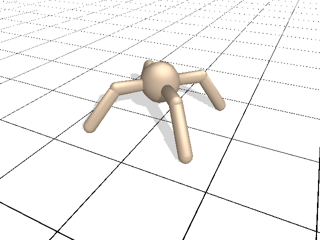

In [20]:
Image(image.render(env.sys, [s.qp for s in rollout], width=320, height=240))

In [21]:
images = image.render(env.sys, [s.qp for s in rollout], width=320, height=240)

In [24]:
print(type(images)) 

<class 'bytes'>


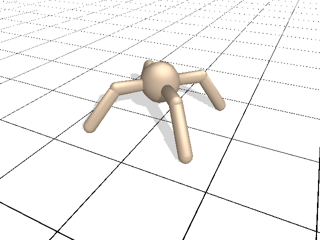

In [26]:
Image(images, embed=True)  

In [27]:
print(type(Image(images, embed=True)  ))


<class 'IPython.core.display.Image'>


In [ ]:
from google.colab import drive 
drive.mount('/content/drive') 
%cd /content/drive/MyDrive

In [32]:
im.data

b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x01@\x00\x00\x00\xf0\x08\x02\x00\x00\x00\xfeO*<\x00\x00\x00\x08acTL\x00\x00\x00d\x00\x00\x00\x00\xe5\xff\x11\x9d\x00\x00\x00\x1afcTL\x00\x00\x00\x00\x00\x00\x01@\x00\x00\x00\xf0\x00\x00\x00\x00\x00\x00\x00\x00\x002\x03\xe8\x00\x00\n\x80\xffo\x00\x00q:IDATx\x9c\xed}y|T\xd5\xd9\xff9w\xbf\xb3e_ \t[\xc2\xbe\tbE\x04\x15\x17Vw\x14\xb4UQ\xab\xadvQ\xfb\xbeU\xa9\x16\xfb\xab\xadm\xb5\xb6\xdaW[\xb5Z\xd1R\x05\x94U \t\xa0@\t\xa2\x08\x98 \xfb\x12\x96\x84d\xb2\'\xb3\xcf\xdc{\xcf9\xbf?\xce\xe4:N\xb6\xc9\xec@\xbe\xfa\xd1,\x93{\xcf]\x9e\xf3<\xe7\xfb|\x9f\xe7\x00B\x08!\x04!t\xee\xdc9\x84\x10\xe9\tv\xbb]U\xd5\x1e?\xd6+\x04\x1e\xd3n\xb7WTTTTT\xd8\xedv\xfd\'{\xf6\xec\x89\xe9\x00B\x84\xaa\xaat0v\xbb}\xdf\xbe}\xe7\xce\x9d\xdb\xb7o_\xe0\xc0\x02\xc7I?\xdc\xe31\x11B\xf4\x0f\xcf\x9d;\x17\xf8\xe7\x91\x83\x1e3\xe8f\x86=N\xfd\x98[\xb7n\r\xfd\xf3=\xc2\xe1p|\xf9\xe5\x97v\xbb=hT\xf4\\A\'\n\xf1\xd1\xbb\xdd\xee\x96\x96\x96\xe8\xde\xccnF\xd5\xf1\'\xa1?\xfa\xc8o&\xa0\xffs\xbb\x

In [29]:
im = Image(images) 
im.save('gif') 

AttributeError: ignored

TypeError: ignored

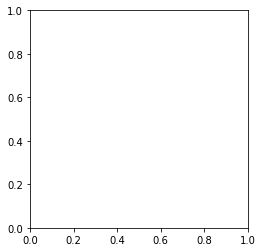

In [31]:
import matplotlib.pyplot as plt 
plt.imshow(im.data) 
plt.show() 

In [28]:
for i in Image(images, embed=True):
    print(Image(images, embed=True)[i])

TypeError: ignored

In [22]:
print(images.shape) 

AttributeError: ignored

In [23]:
for i in images:
    print(images[i].shape)

AttributeError: ignored